# Initial Conditions Optimization
## Plot History

In [56]:
%matplotlib inline
import matplotlib
matplotlib.font_manager._rebuild()
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from datetime import datetime,timedelta
import matplotlib.style as style
style.use('fivethirtyeight')
import ray
import io
import os
from IPython.display import display, HTML, Markdown

## Load PlayFair Display and Roboto Fonts from Google

In [57]:
from tempfile import NamedTemporaryFile
import urllib.request
import matplotlib.font_manager as fm

github_url = 'https://github.com/google/fonts/blob/master/ofl/playfairdisplay/static/PlayfairDisplay-Regular.ttf'
url = github_url + '?raw=true'  # You want the actual file, not some html

request = urllib.request.Request(url)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()
heading_font = fm.FontProperties(fname=f.name, size=28)

github_url = 'https://github.com/google/fonts/blob/master/ofl/roboto/static/Roboto-Regular.ttf'
url = github_url + '?raw=true'  # You want the actual file, not some html

request = urllib.request.Request(url)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()
subtitle_font = fm.FontProperties(fname=f.name, size=20)


## Load Humor Sans Font

In [58]:
github_url = 'http://antiyawn.com/uploads/Humor-Sans-1.0.ttf'
url = github_url + '?raw=true'  # You want the actual file, not some html

request = urllib.request.Request(url)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()
comic_font = fm.FontProperties(fname=f.name, size=18)

# Main code

In [59]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines){
    return false;}

<IPython.core.display.Javascript object>

## Load Initial Parameters

In [60]:
dfparam = pd.read_csv("data/param.csv")
display(dfparam)


,DRS,start-date,prediction-range,s0,e0,a0,i0,r0,d0,START,RATIO,WCASES,WREC
0,DRS 01 - Grande São Paulo,2020-03-20,200,2000000.0,0.0001,0.0001,800.0000,300.0000,400.0000,0,0.15,0.15,0.05
1,DRS 02 - Araçatuba,2020-04-01,200,500.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
2,DRS 03 - Araraquara,2020-04-01,200,2000.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
3,DRS 04 - Baixada Santista,2020-04-01,200,8000.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
4,DRS 05 - Barretos,2020-04-01,200,2000.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
5,DRS 06 - Bauru,2020-04-01,200,10000.0,0.0001,0.0001,4.0000,0.0001,0.0001,0,0.15,0.40,0.10
6,DRS 07 - Campinas,2020-04-01,200,20000.0,0.0001,0.0001,40.0000,0.0001,0.0001,0,0.15,0.40,0.10
7,DRS 08 - Franca,2020-04-01,200,1000.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
8,DRS 09 - Marília,2020-04-01,200,5000.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
9,DRS 10 - Piracicaba,2020-04-01,200,10000.0,0.0001,0.0001,0.0001,0.0001,1.0000,0,0.15,0.40,0.10


## Select data set

In [61]:
opt=1

#select history file version, model and states
if opt==0:
    version=105
    model="Yabox"
    DRS=dfparam.DRS

if opt==1:
    version=106
    model="Yabox"
    DRS=dfparam.DRS
    

In [62]:
strFile="results/IC_optimizeddistrictRegions"+str(version)+".csv"
if os.path.isfile(strFile):
    os.remove(strFile)

## Plot and Save Results

# Results for DRS 01 - Grande São Paulo District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
88,2.463042e+08,2020-03-18,219,3429577,2715,263,0.7284,0.025


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
88,2.463042e+08,2020-03-18,219,3429577,2715,263,0.7284,0.0250
9,2.690156e+08,2020-03-19,137,6387004,2146,375,0.3640,0.0353
100,2.712151e+08,2020-03-20,247,6778162,2943,784,0.3957,0.0470
111,3.016948e+08,2020-03-18,110,8399329,3152,554,0.4412,0.0455
63,3.247953e+08,2020-03-20,90,8715675,2574,742,0.3956,0.0357


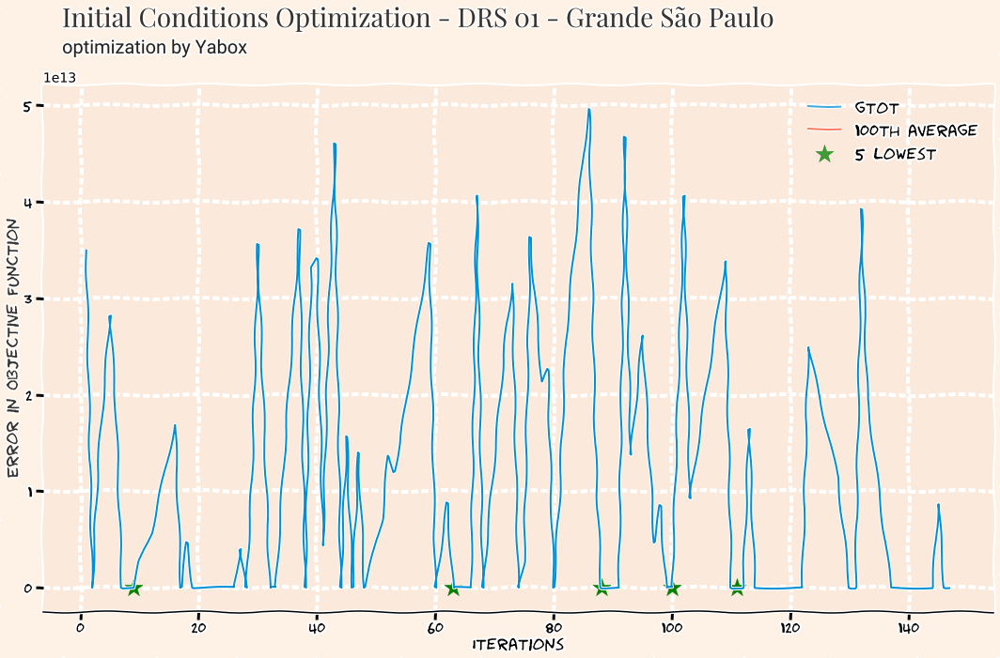

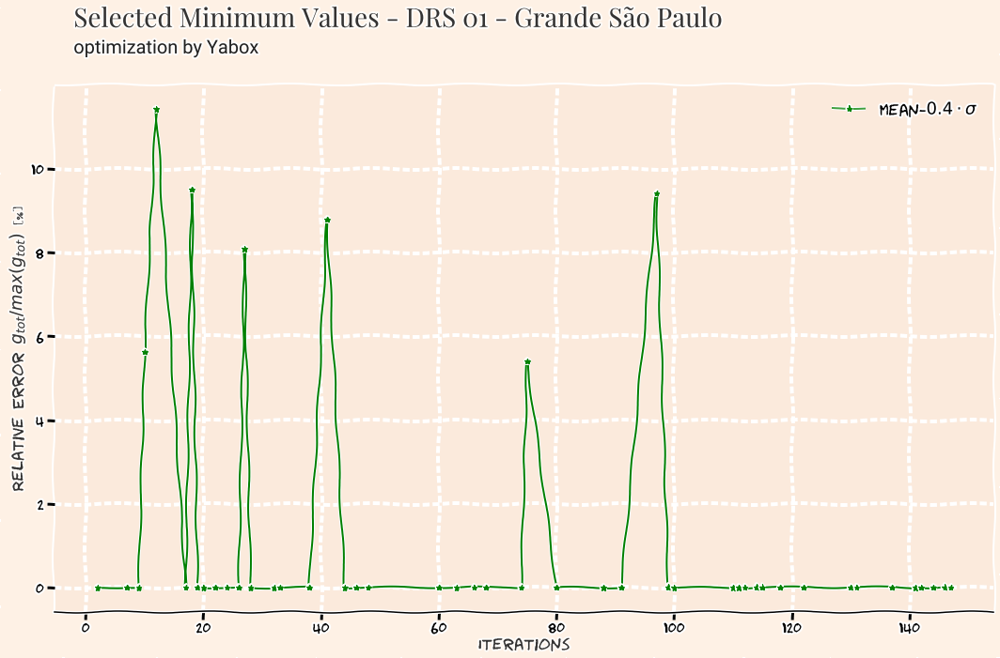

# Results for DRS 02 - Araçatuba District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
152,237585.437198,2020-04-02,237,609088,1644,90,0.6818,0.0511


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
152,237585.437198,2020-04-02,237,609088,1644,90,0.6818,0.0511
169,400897.866013,2020-03-31,140,496602,1018,393,0.5100,0.0581
167,448701.065624,2020-04-01,174,589458,652,409,0.7134,0.0359
105,484317.853944,2020-04-01,101,189200,638,517,0.6112,0.0399
20,682251.547419,2020-03-31,90,135115,1959,615,0.3055,0.0551


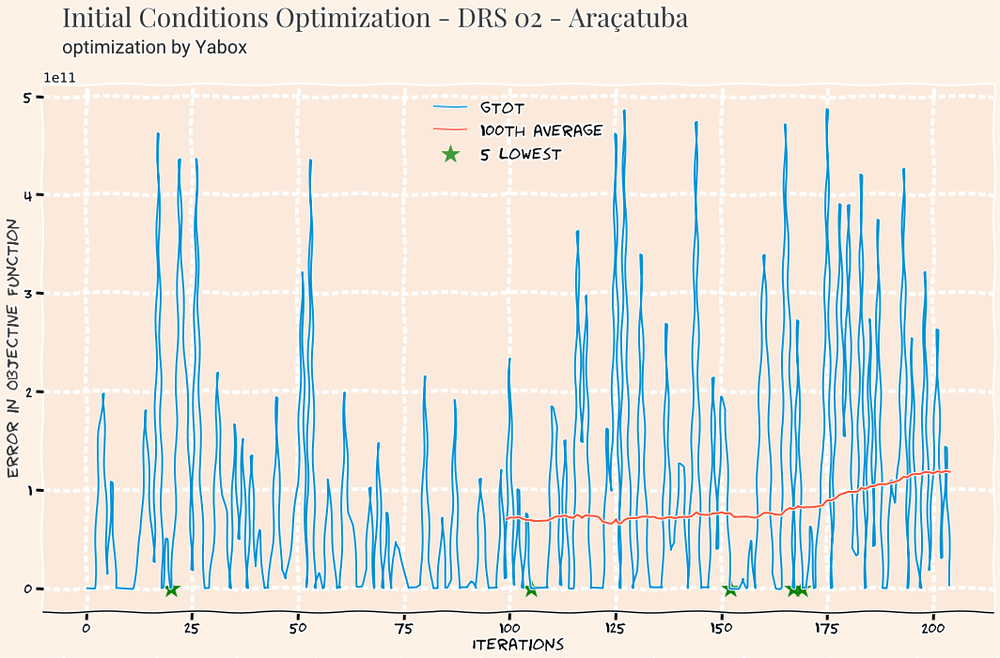

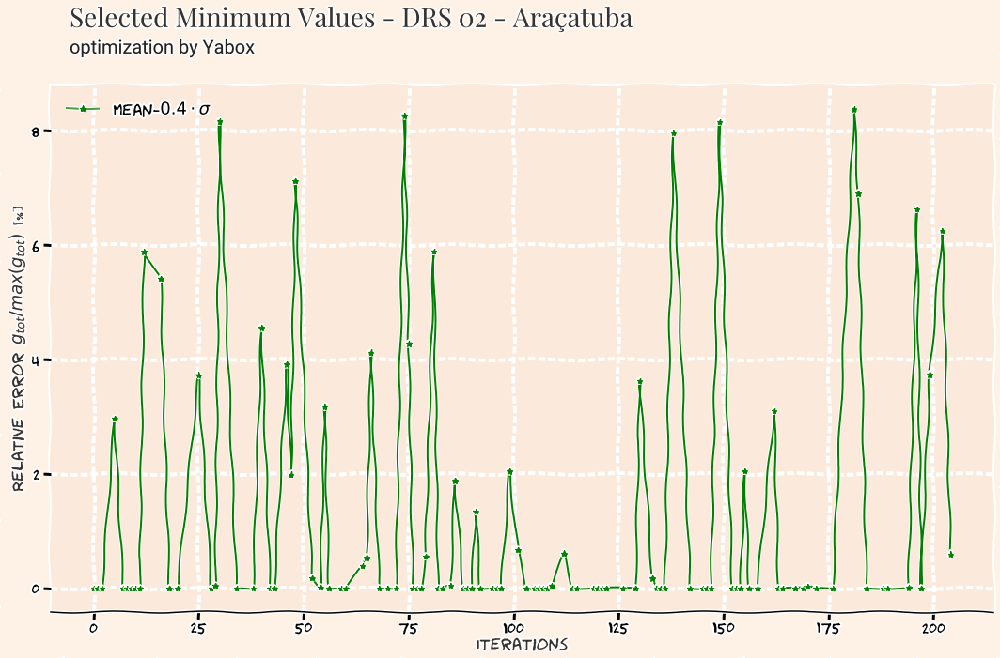

# Results for DRS 03 - Araraquara District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
111,125685.829615,2020-04-01,135,125940,556,10,0.4132,0.0661


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
111,125685.829615,2020-04-01,135,125940,556,10,0.4132,0.0661
106,164080.645230,2020-04-01,4,865381,586,217,0.7214,0.0489
37,198055.384247,2020-03-31,199,419548,825,189,0.6865,0.0507
126,351912.573513,2020-04-02,111,650398,1122,200,0.5278,0.0238
55,425856.731215,2020-04-02,176,334859,1346,268,0.5810,0.0331


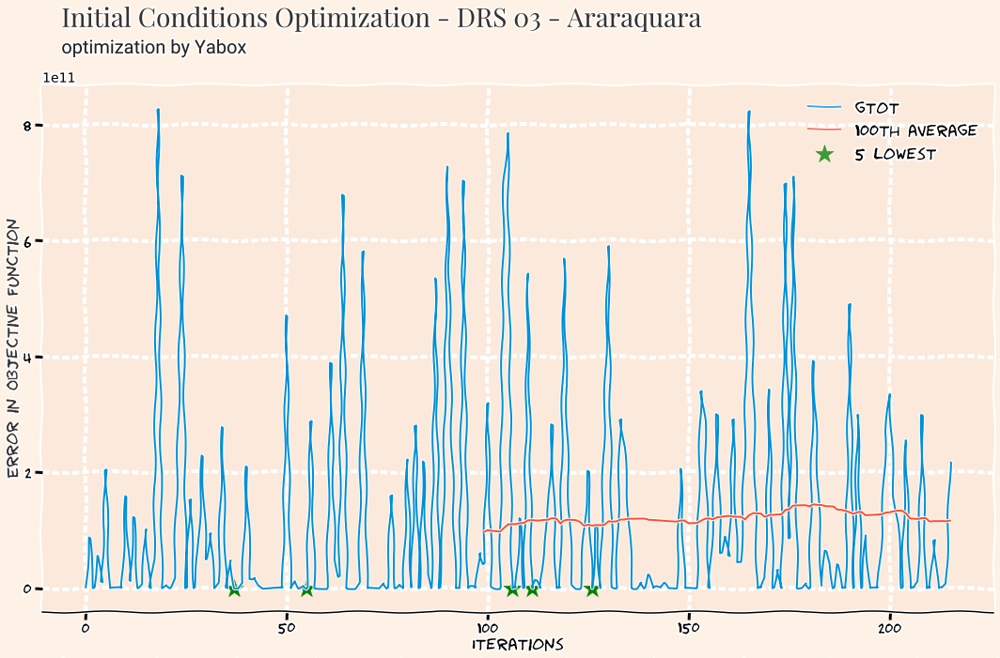

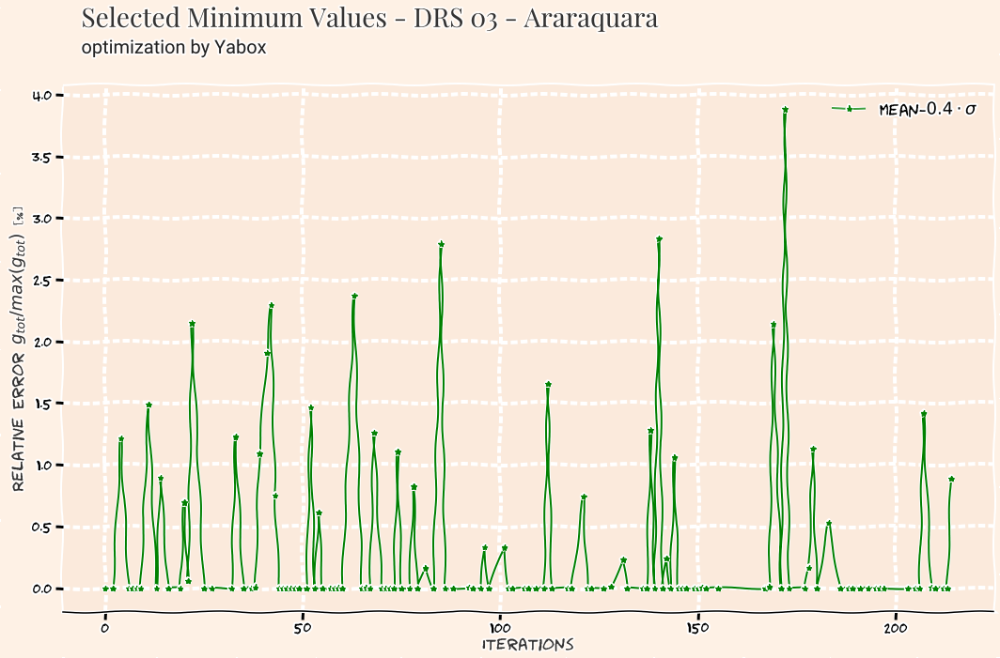

# Results for DRS 04 - Baixada Santista District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
72,981478.11471,2020-04-02,78,543935,2038,895,0.7677,0.0691


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
72,9.814781e+05,2020-04-02,78,543935,2038,895,0.7677,0.0691
145,1.142534e+06,2020-03-31,212,1307702,2530,265,0.5363,0.0636
102,4.464226e+06,2020-04-02,180,937581,886,224,0.5187,0.0372
137,4.730557e+06,2020-03-31,32,1413347,886,450,0.5187,0.0587
48,6.403327e+06,2020-04-02,165,703852,1495,463,0.3246,0.0429


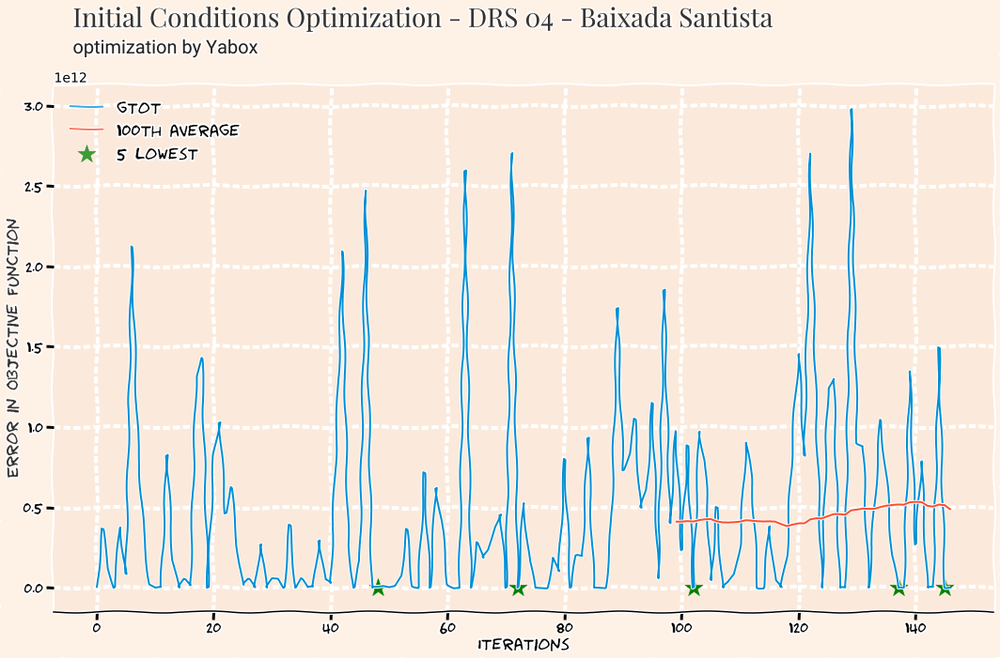

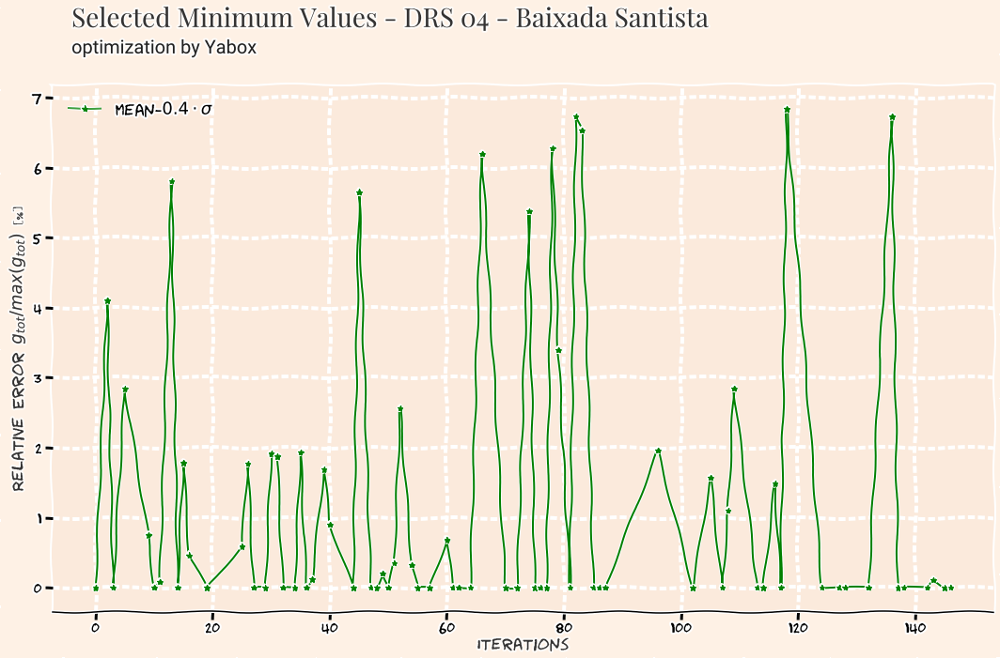

# Results for DRS 05 - Barretos District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
59,93284.869597,2020-04-02,246,330072,446,32,0.4488,0.0382


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
59,93284.869597,2020-04-02,246,330072,446,32,0.4488,0.0382
173,186333.734145,2020-04-01,206,347760,219,119,0.5385,0.0648
201,191593.554308,2020-03-30,32,307455,672,322,0.6190,0.0237
145,292313.954304,2020-03-31,120,230441,992,235,0.3907,0.0434
75,294789.692086,2020-03-31,110,143753,1693,22,0.5500,0.0224


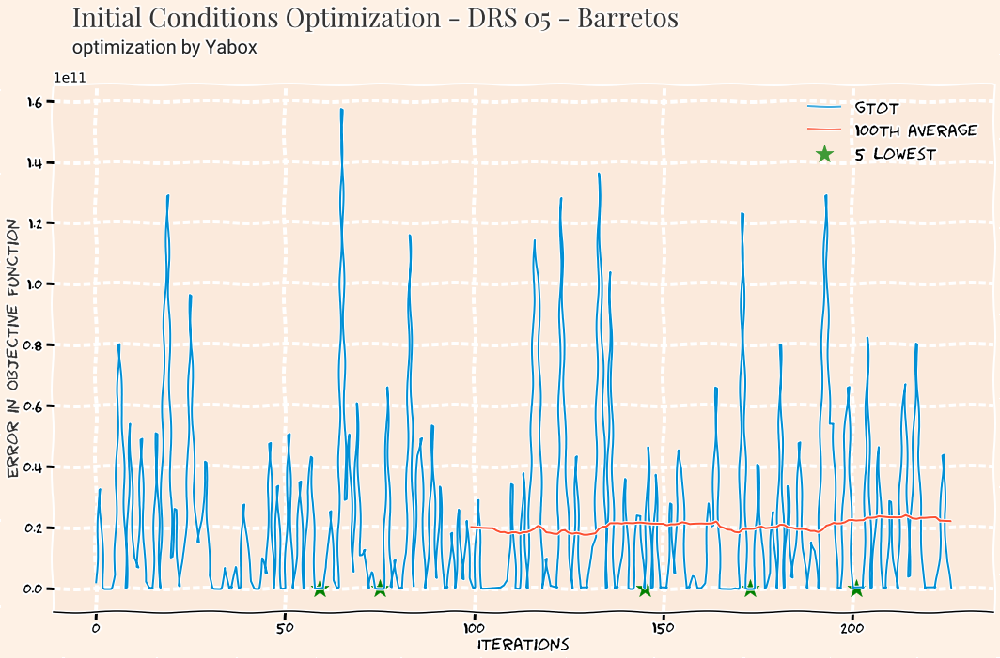

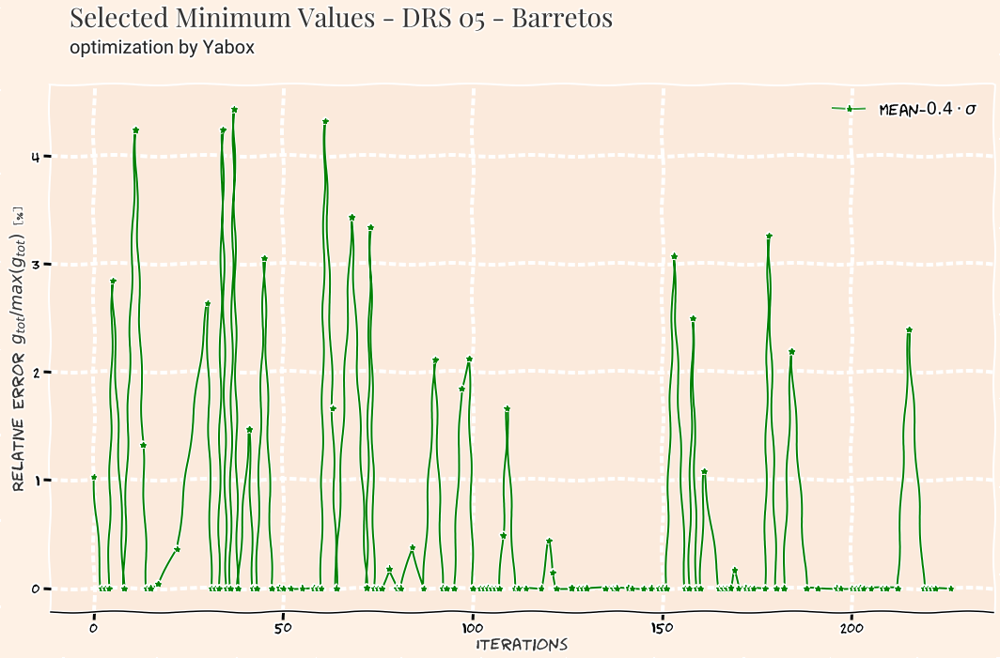

# Results for DRS 06 - Bauru District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
53,539994.156613,2020-03-31,241,857122,543,228,0.6471,0.0287


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
53,5.399942e+05,2020-03-31,241,857122,543,228,0.6471,0.0287
156,7.443393e+05,2020-03-31,69,651742,1552,35,0.3632,0.0658
170,8.178646e+05,2020-04-02,18,1519692,1502,188,0.4883,0.0636
97,1.115939e+06,2020-03-31,9,1362101,1005,455,0.6551,0.0364
82,1.192765e+06,2020-04-02,208,886284,1311,493,0.3853,0.0705


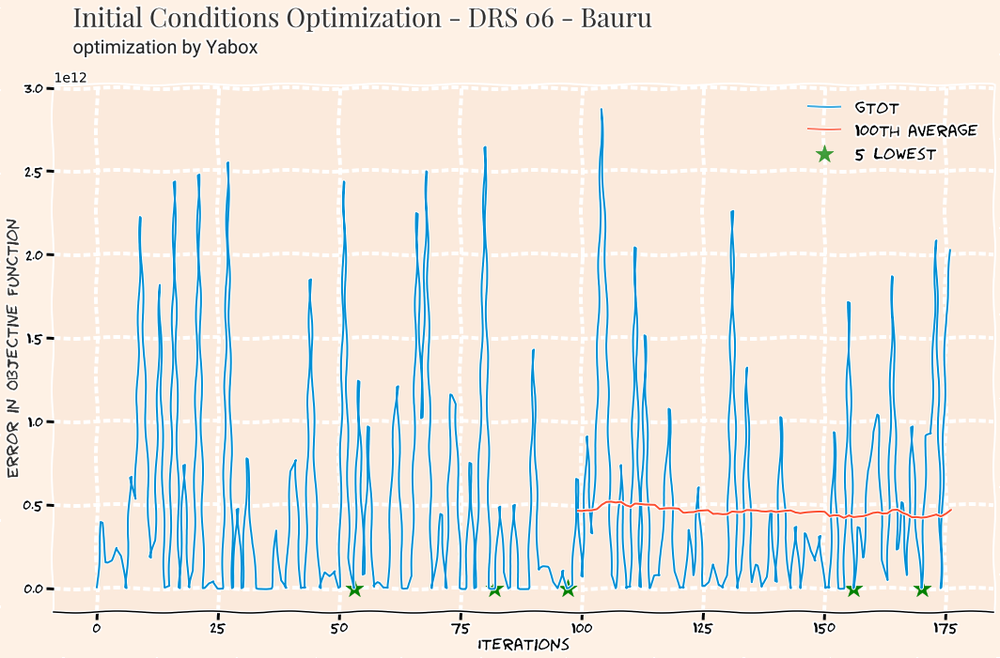

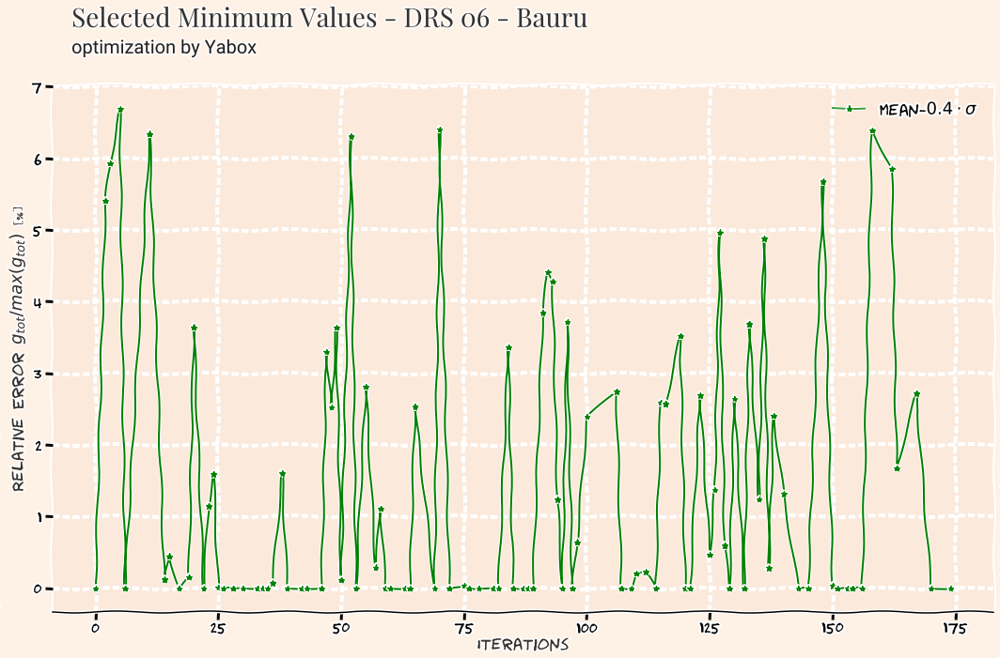

# Results for DRS 07 - Campinas District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
63,3.766531e+06,2020-04-01,204,811781,1043,422,0.4593,0.0444


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
63,3.766531e+06,2020-04-01,204,811781,1043,422,0.4593,0.0444
62,4.757048e+06,2020-03-30,5,2333756,2274,747,0.5936,0.0238
111,4.859021e+06,2020-04-01,67,1796397,1621,40,0.6645,0.0495
93,6.030810e+06,2020-03-31,105,3377503,1772,715,0.5285,0.0597
43,6.252879e+06,2020-04-02,210,3792472,816,728,0.3635,0.0683


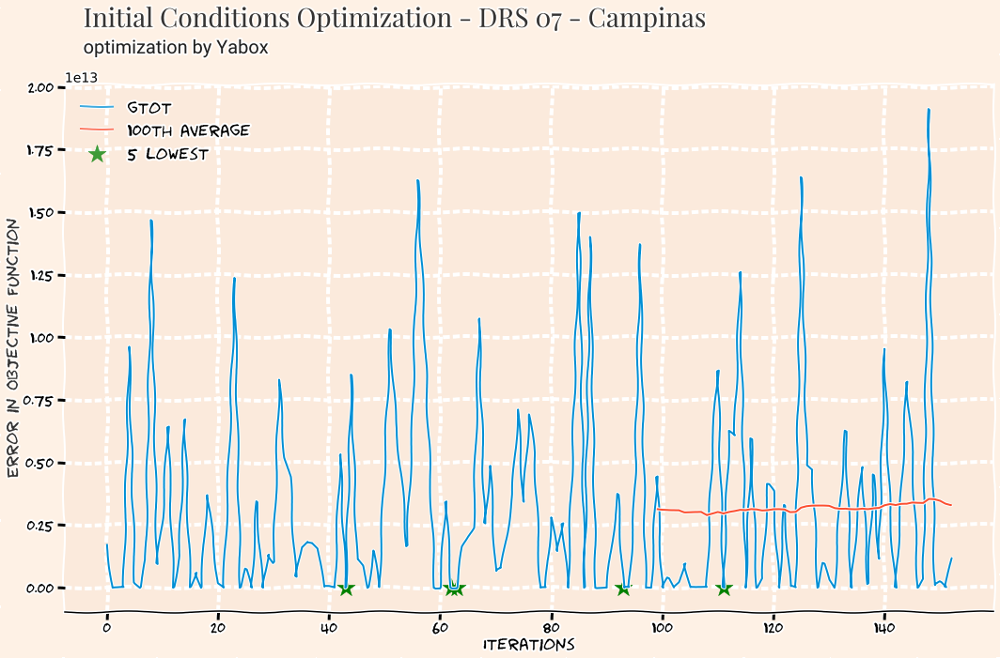

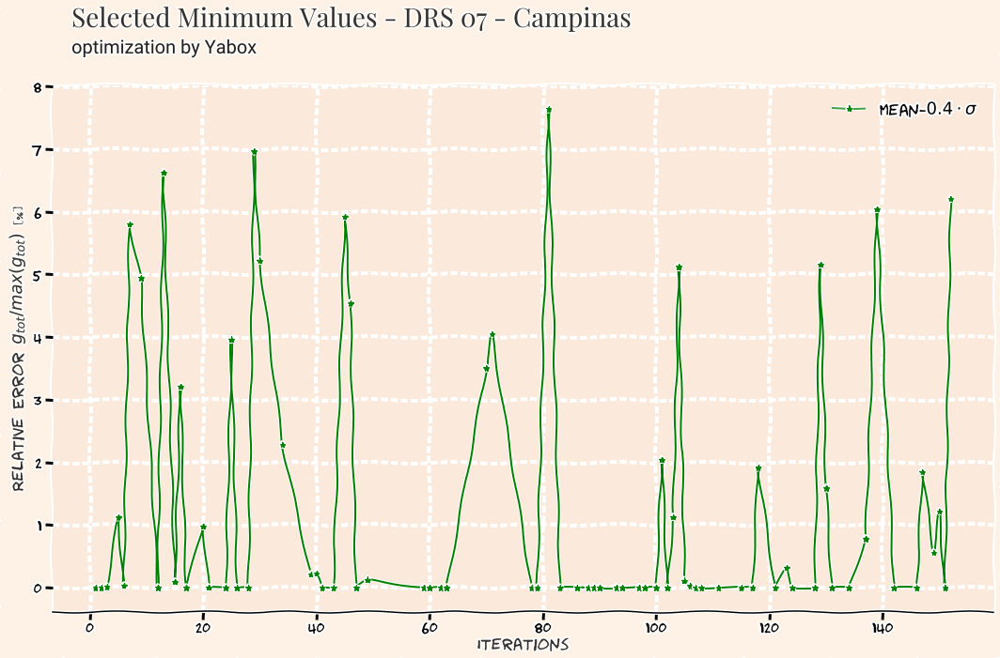

# Results for DRS 08 - Franca District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
217,99779.783123,2020-04-01,110,528415,672,24,0.724,0.0241


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
217,99779.783123,2020-04-01,110,528415,672,24,0.7240,0.0241
133,126951.410973,2020-03-31,58,251565,587,58,0.4686,0.0350
246,159216.374694,2020-04-02,155,127614,380,334,0.4428,0.0758
105,165302.058306,2020-04-02,100,634977,1507,172,0.7890,0.0800
156,174416.315461,2020-03-31,17,269110,981,304,0.6999,0.0593


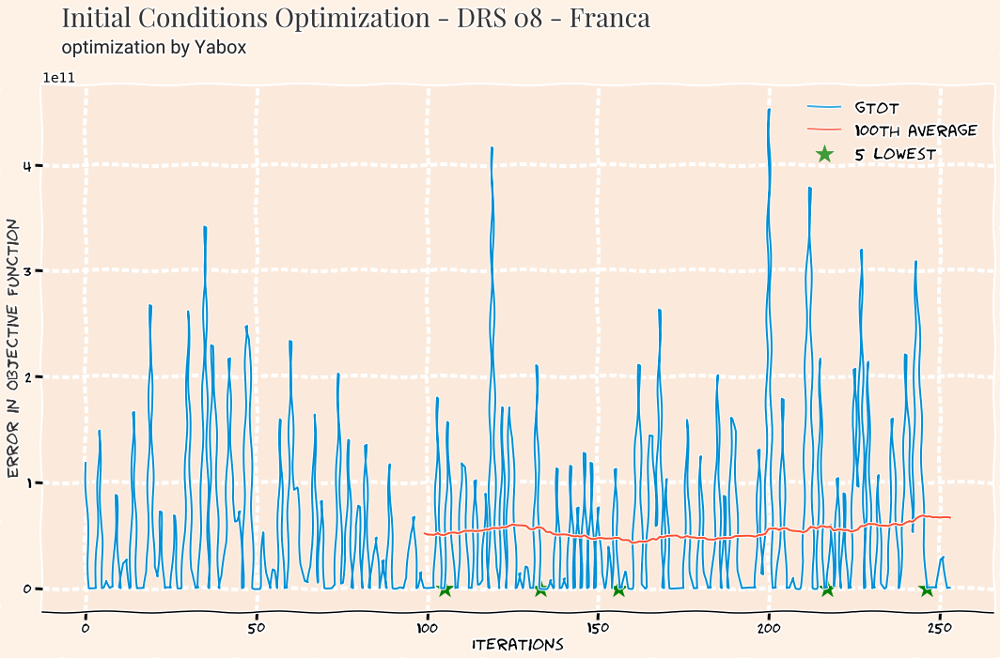

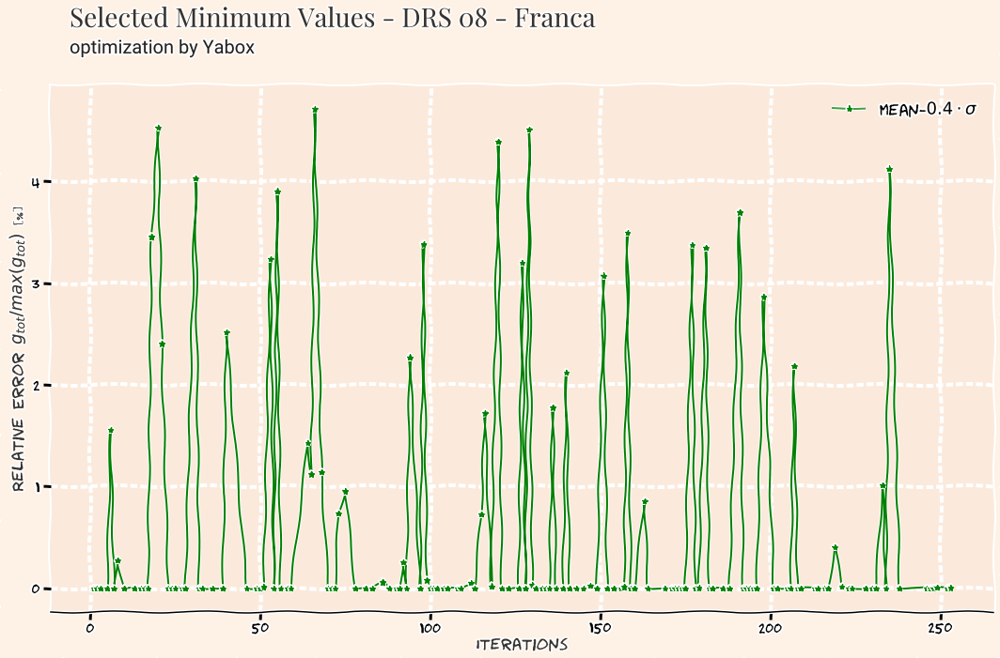

# Results for DRS 09 - Marília District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
0,163233.527582,2020-04-01,196,430205,1045,190,0.6997,0.0578


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
0,163233.527582,2020-04-01,196,430205,1045,190,0.6997,0.0578
140,291154.716059,2020-04-01,159,427307,1430,322,0.6997,0.0633
208,301484.213475,2020-04-02,53,824150,459,393,0.6901,0.0434
213,368597.579719,2020-03-31,77,526921,739,278,0.3203,0.0249
143,454088.201253,2020-04-01,113,894684,739,149,0.5188,0.0478


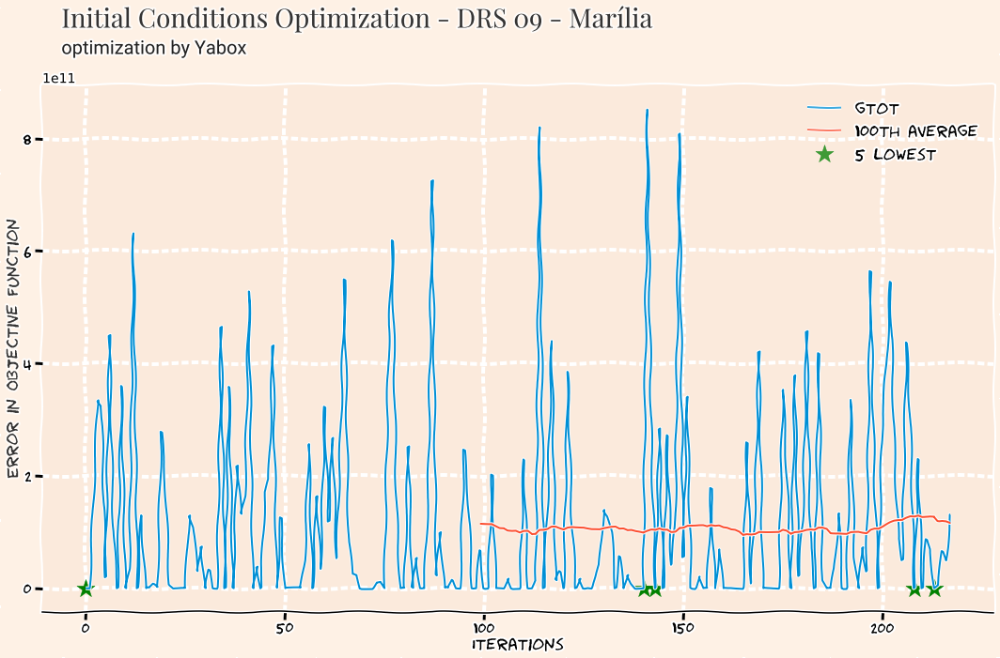

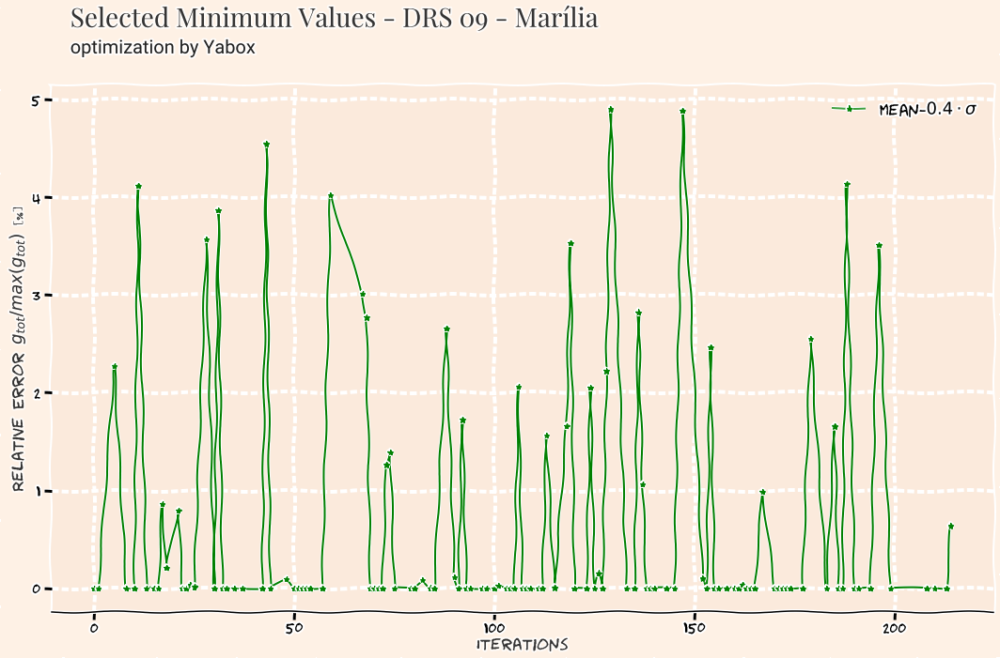

# Results for DRS 10 - Piracicaba District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
170,614503.638614,2020-03-31,133,342430,2113,214,0.7944,0.0528


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
170,614503.638614,2020-03-31,133,342430,2113,214,0.7944,0.0528
24,741385.987899,2020-04-01,49,242229,689,731,0.3904,0.0272
158,815807.341116,2020-03-30,81,678335,889,323,0.3039,0.0663
91,829973.871789,2020-03-31,170,771315,764,636,0.5989,0.0388
175,884586.939048,2020-03-31,36,427335,2136,596,0.7316,0.0796


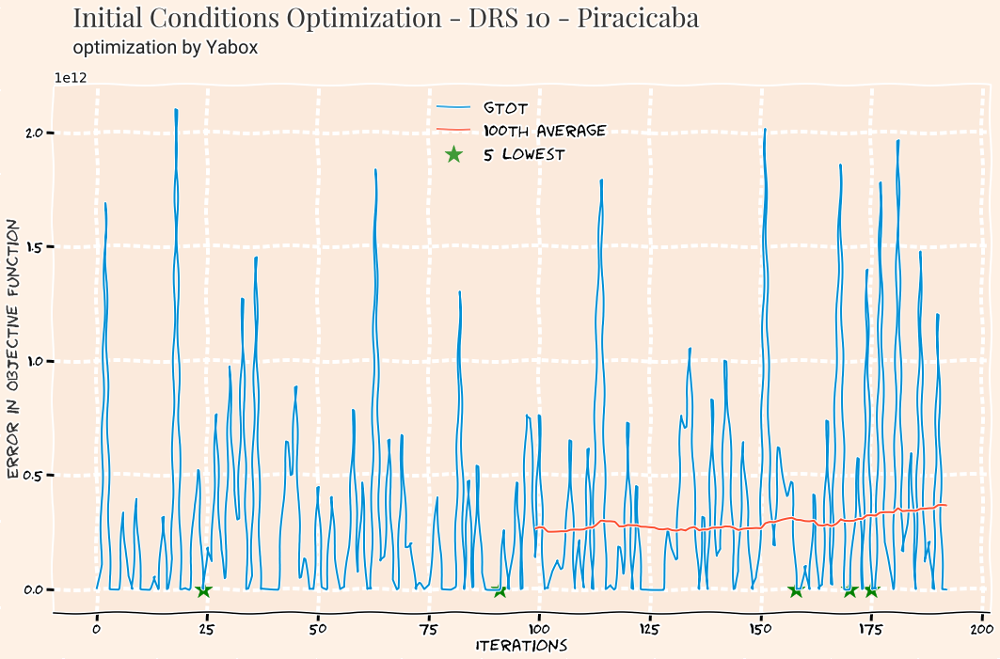

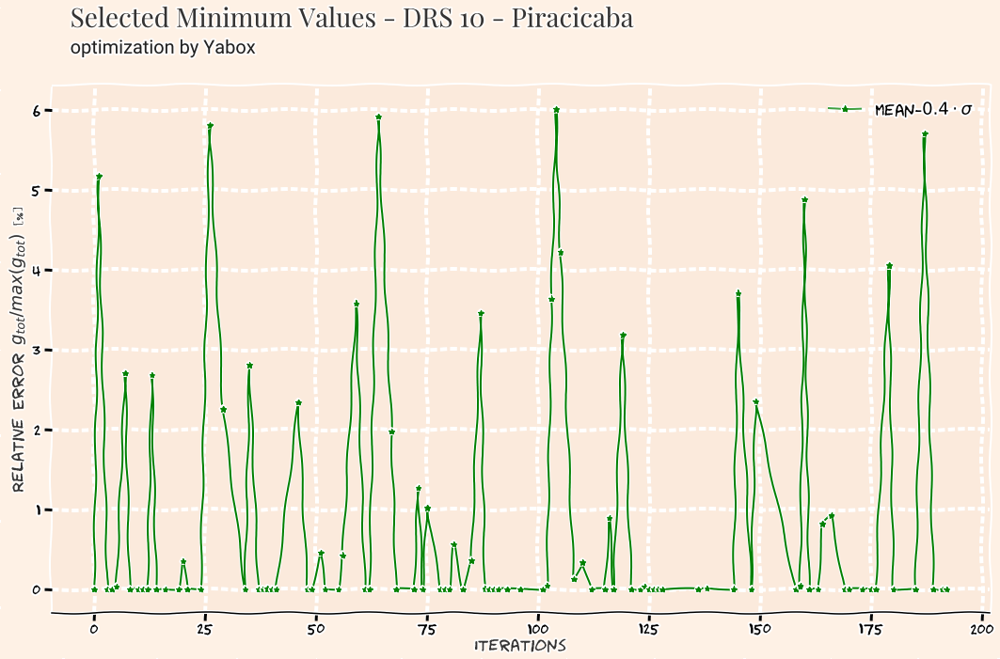

# Results for DRS 11 - Presidente Prudente District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
205,280286.267438,2020-04-02,232,477222,1665,157,0.6203,0.029


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
205,280286.267438,2020-04-02,232,477222,1665,157,0.6203,0.0290
191,301311.340757,2020-04-01,55,671990,837,864,0.5336,0.0571
108,349152.166685,2020-03-31,133,601997,1496,301,0.5567,0.0643
234,420553.531798,2020-04-01,101,676610,1115,640,0.6047,0.0741
93,446961.776198,2020-03-31,102,586275,951,456,0.4809,0.0551


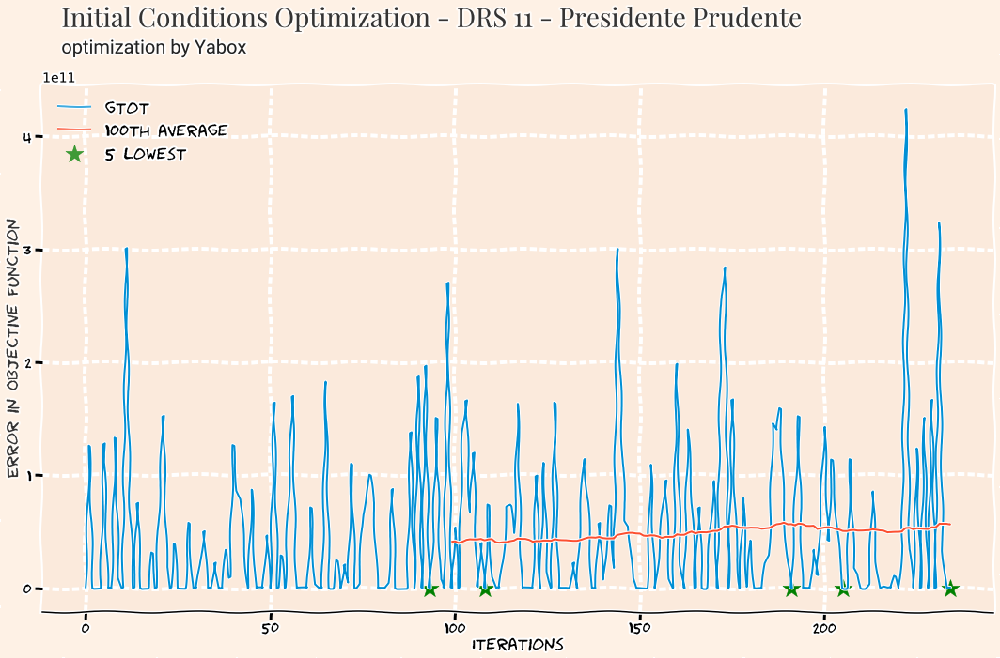

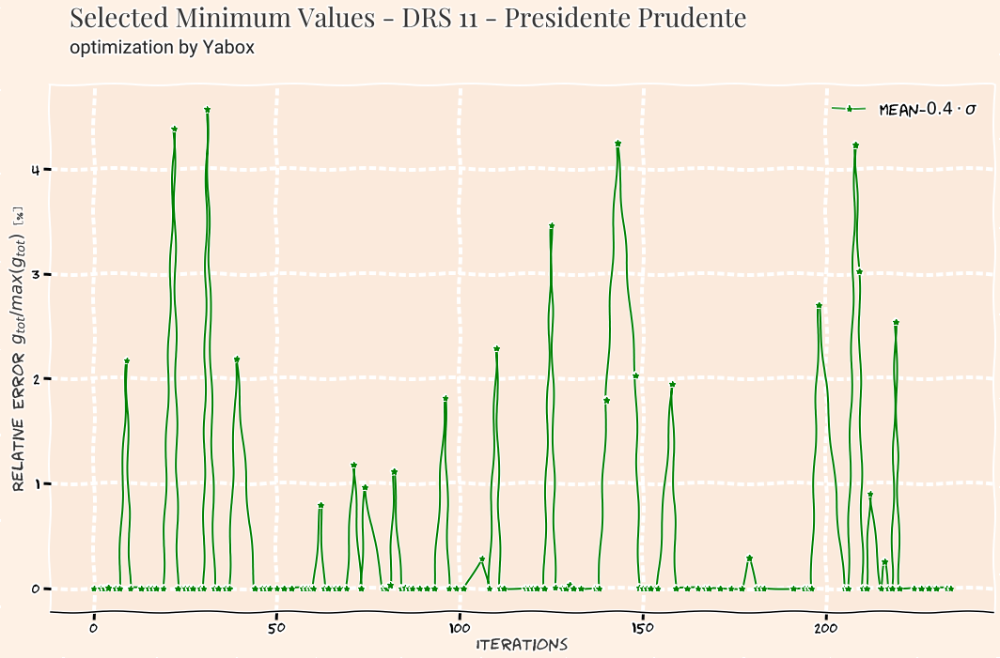

# Results for DRS 12 - Registro District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
114,38907.504339,2020-03-30,77,82654,149,73,0.373,0.0433


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
114,38907.504339,2020-03-30,77,82654,149,73,0.3730,0.0433
104,106511.353944,2020-04-02,24,253338,324,356,0.6061,0.0713
10,130816.701858,2020-04-01,157,147727,856,968,0.3217,0.0533
89,169339.518286,2020-03-30,21,46143,928,147,0.4006,0.0468
71,177585.969931,2020-04-02,76,37442,1334,182,0.7916,0.0459


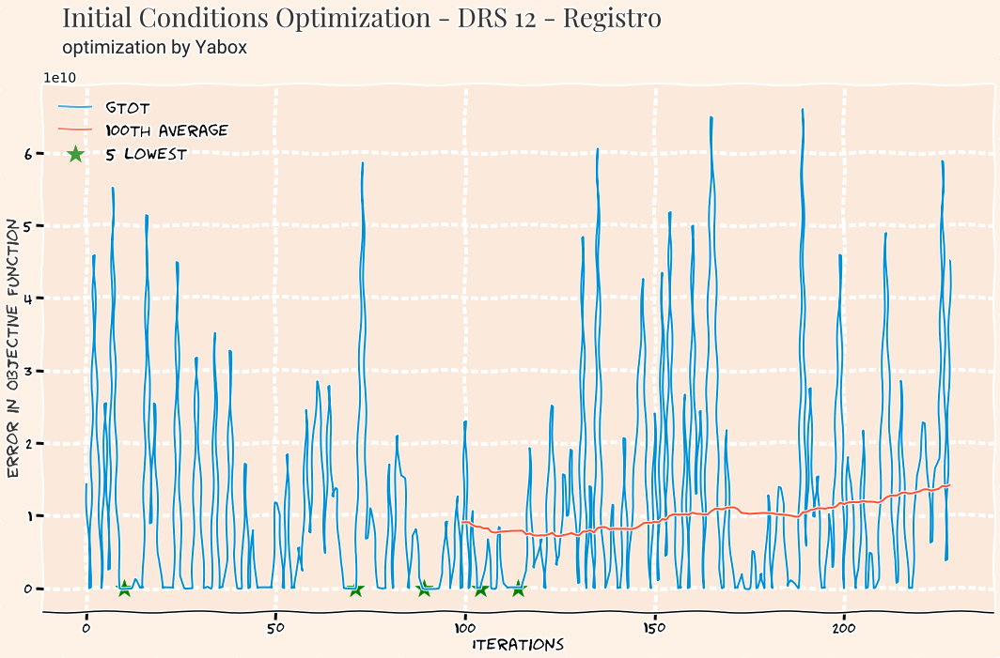

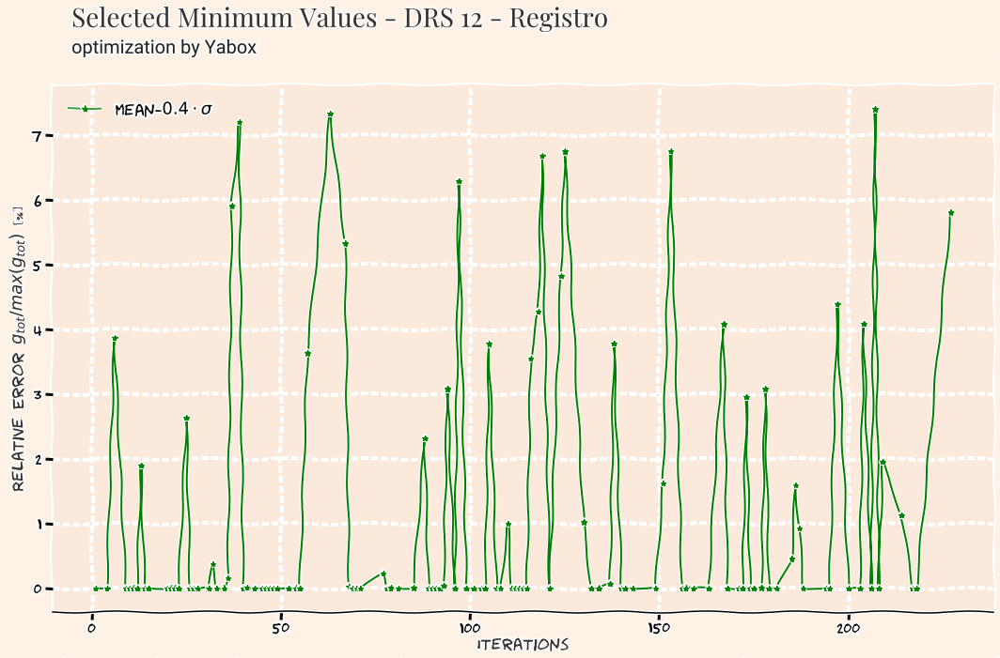

# Results for DRS 13 - Ribeirão Preto District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
123,393398.773965,2020-04-01,233,577599,432,226,0.5738,0.0627


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
123,393398.773965,2020-04-01,233,577599,432,226,0.5738,0.0627
120,396552.957288,2020-03-30,109,1232196,2345,154,0.6445,0.0773
94,477698.462281,2020-04-02,221,695245,527,92,0.4093,0.0316
63,768608.213576,2020-04-01,225,453529,1744,505,0.6944,0.0273
106,875166.812101,2020-03-31,89,986063,644,534,0.3598,0.0374


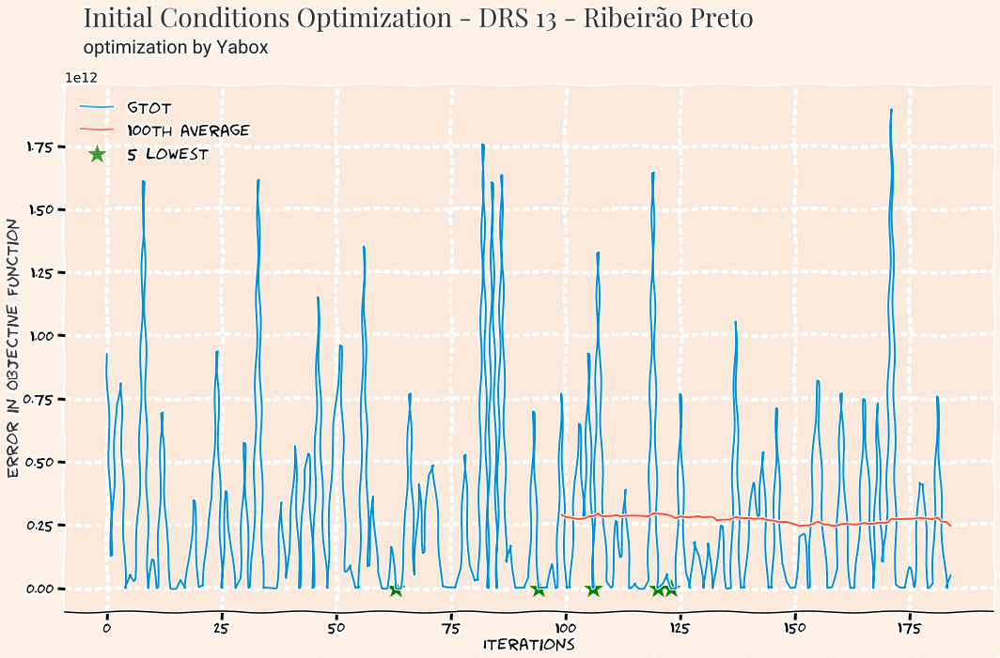

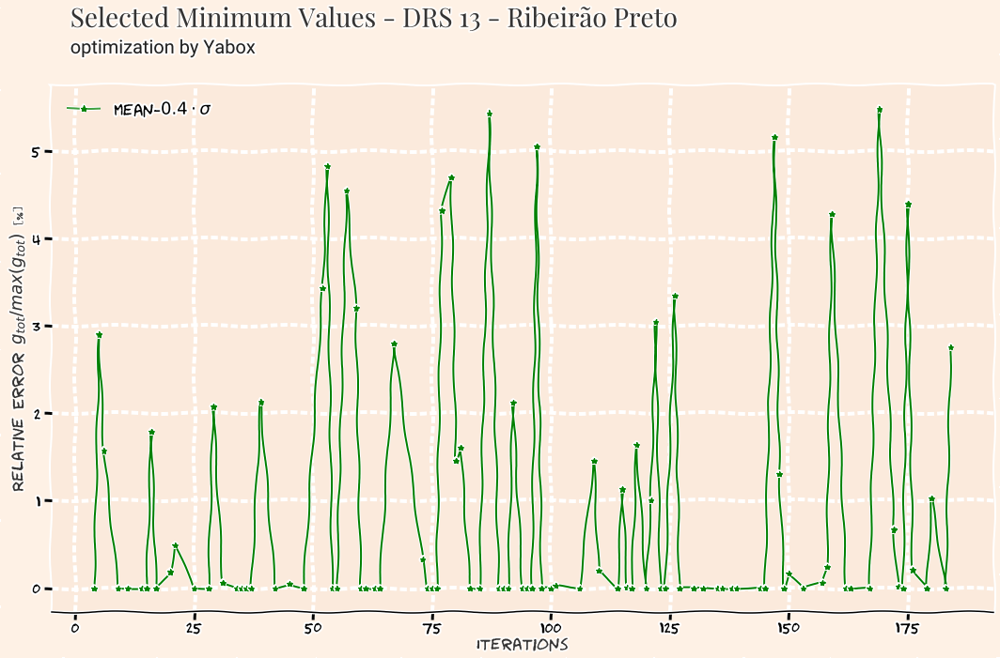

# Results for DRS 14 - São João da Boa Vista District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
89,135896.807867,2020-04-02,219,235223,369,9,0.4843,0.0734


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
89,135896.807867,2020-04-02,219,235223,369,9,0.4843,0.0734
25,211270.734827,2020-03-31,76,702243,1206,182,0.6566,0.0672
37,234678.359458,2020-04-01,208,608651,1373,284,0.7186,0.0637
185,245436.544528,2020-03-31,153,582089,1129,182,0.5529,0.0406
38,246670.393435,2020-03-31,159,555370,1421,135,0.6276,0.0216


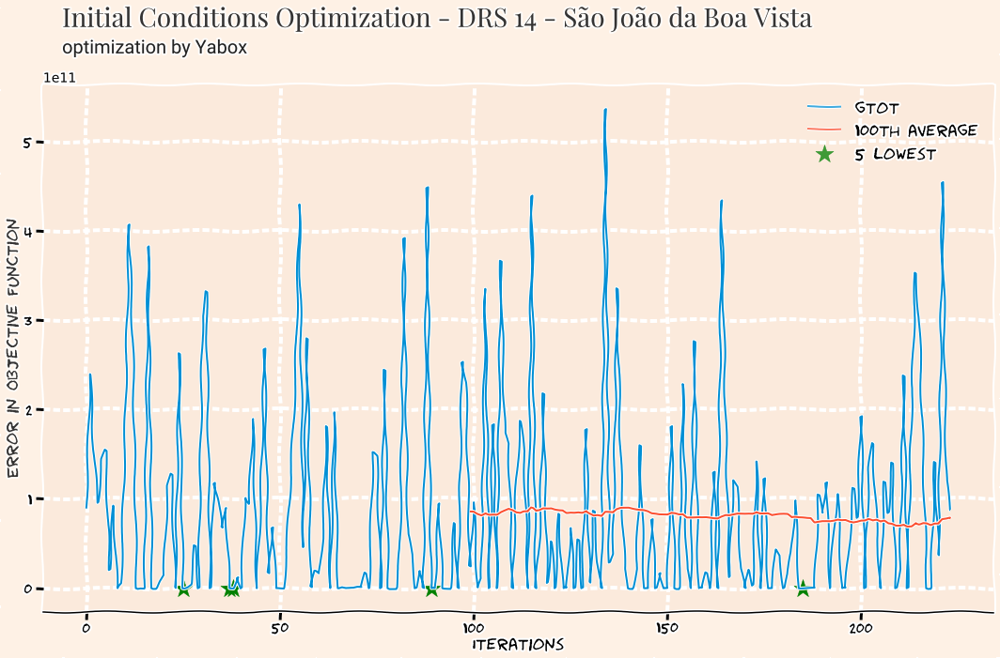

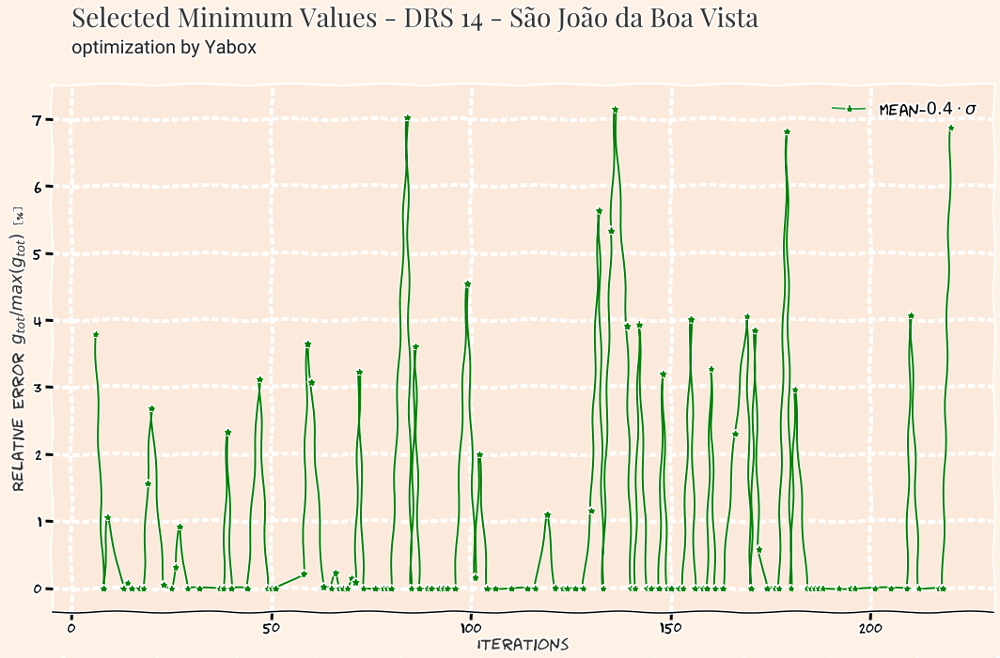

# Results for DRS 15 - São José do Rio Preto District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
8,608447.56837,2020-04-02,163,703328,672,194,0.4658,0.0631


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
8,6.084476e+05,2020-04-02,163,703328,672,194,0.4658,0.0631
43,7.881484e+05,2020-03-30,163,703328,860,314,0.4658,0.0631
92,8.454619e+05,2020-03-31,73,656811,2860,485,0.4140,0.0201
169,9.680808e+05,2020-03-31,225,196098,1097,433,0.6522,0.0460
98,1.222600e+06,2020-04-02,31,533846,3054,438,0.5019,0.0770


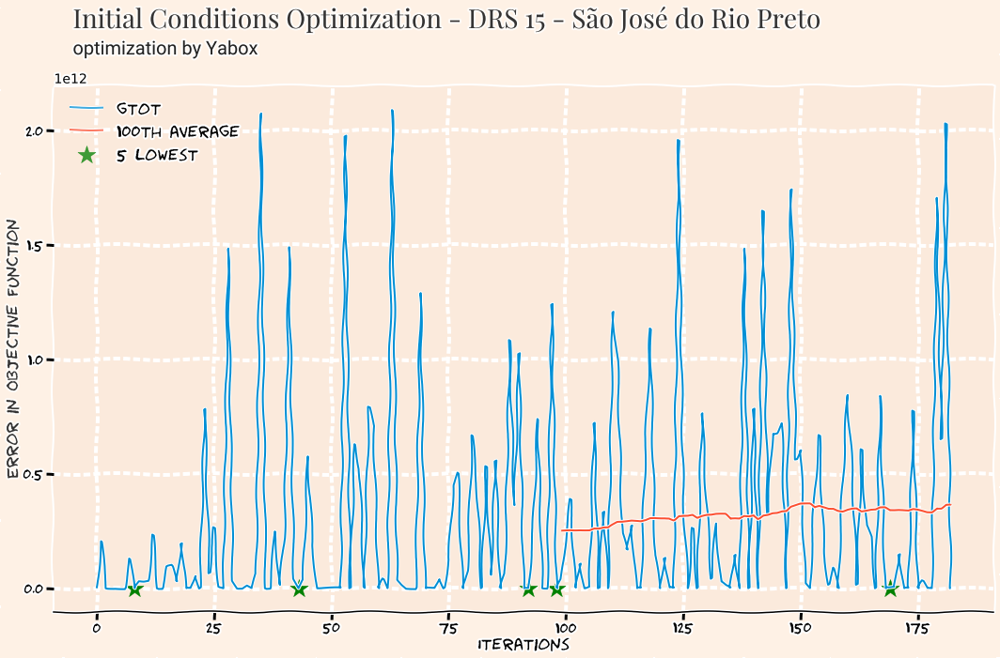

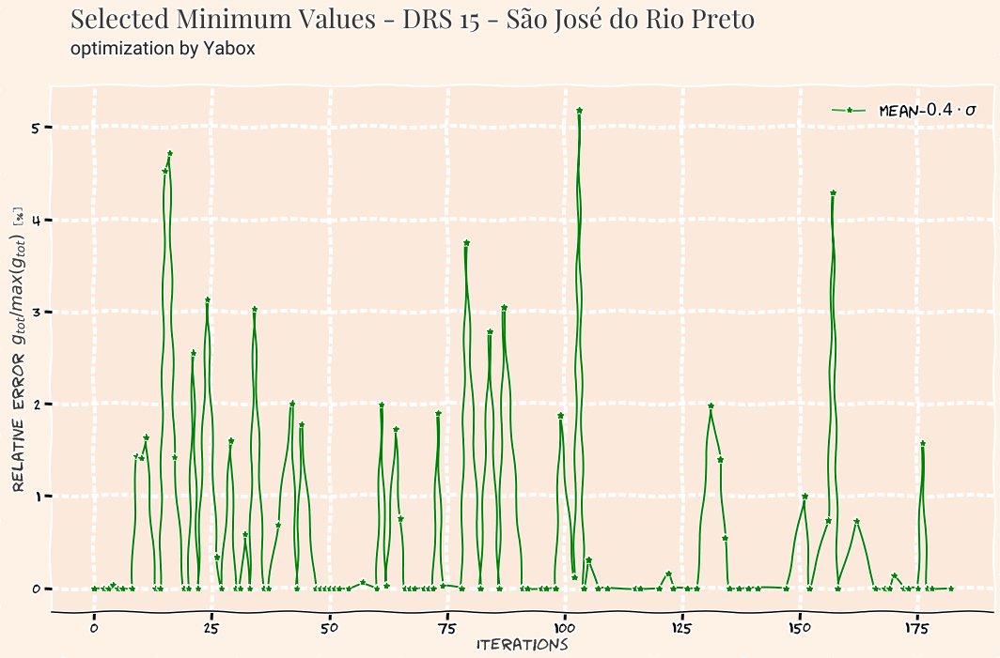

# Results for DRS 16 - Sorocaba District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
7,1.471188e+06,2020-03-30,166,2002778,1556,113,0.3893,0.0252


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
7,1.471188e+06,2020-03-30,166,2002778,1556,113,0.3893,0.0252
176,1.843494e+06,2020-04-01,48,392098,1821,914,0.6214,0.0755
174,2.338250e+06,2020-03-30,128,256761,3965,40,0.6034,0.0504
2,2.502639e+06,2020-04-02,213,281392,3877,541,0.6134,0.0636
147,2.755538e+06,2020-03-30,132,2002778,2812,708,0.6513,0.0491


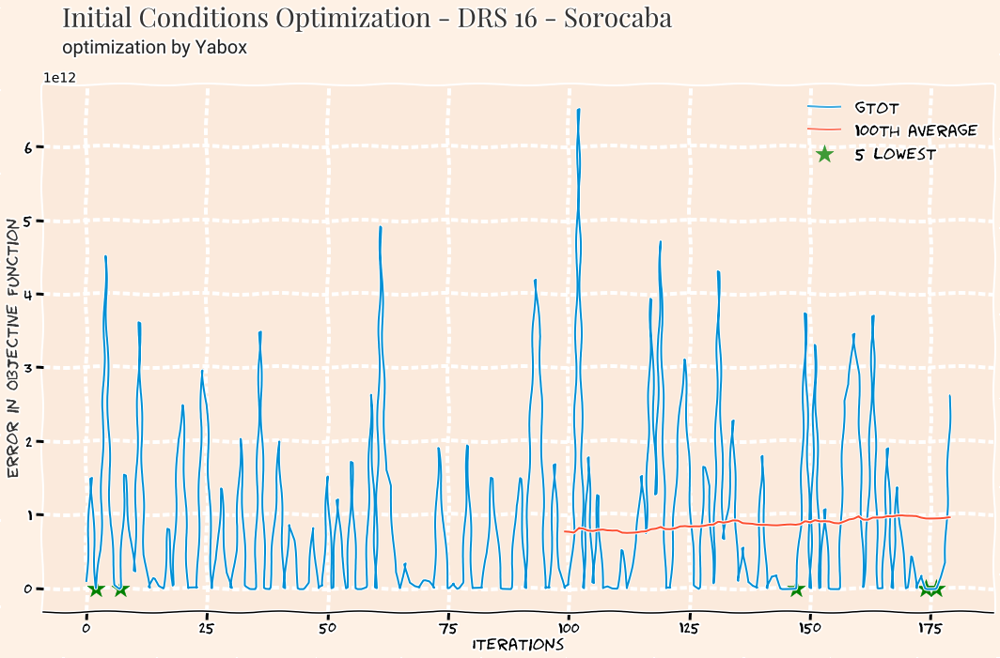

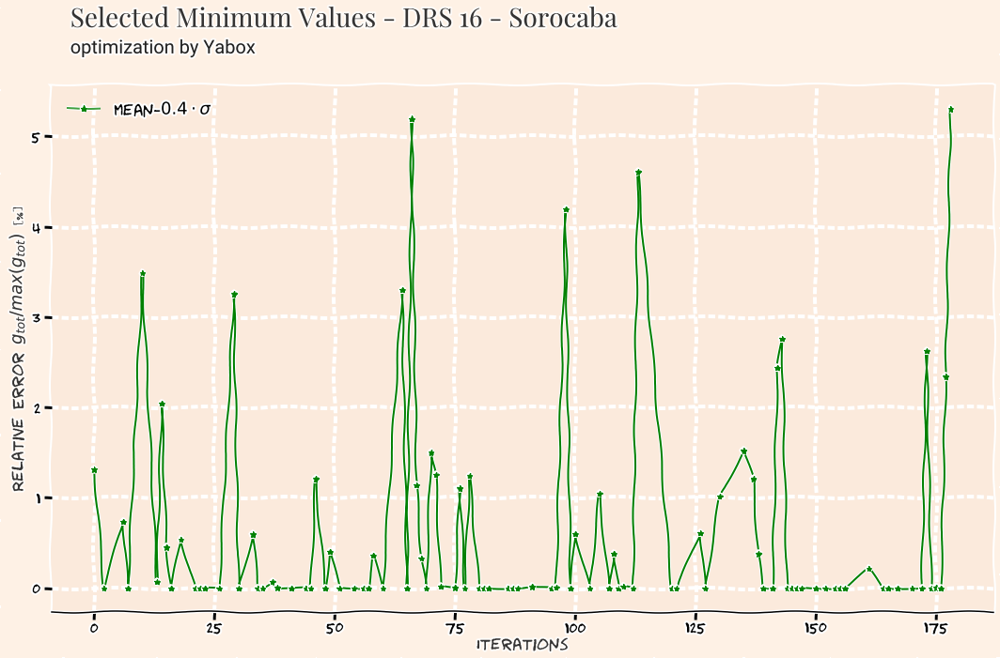

# Results for DRS 17 - Taubaté District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
148,1.060165e+06,2020-04-02,133,2052839,1850,137,0.6588,0.0389


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
148,1.060165e+06,2020-04-02,133,2052839,1850,137,0.6588,0.0389
33,1.159645e+06,2020-04-02,9,368172,2318,117,0.7287,0.0711
67,1.838620e+06,2020-03-30,108,424517,1886,821,0.4705,0.0338
143,2.439391e+06,2020-03-31,147,1856511,2628,24,0.6507,0.0635
102,3.297874e+06,2020-03-31,109,2069628,3141,950,0.4705,0.0435


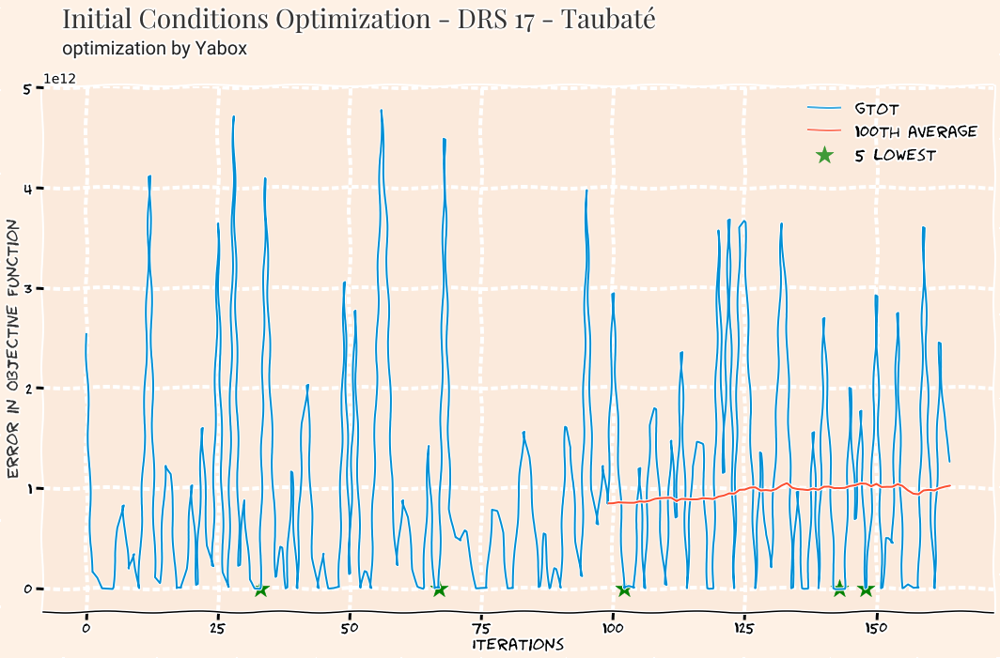

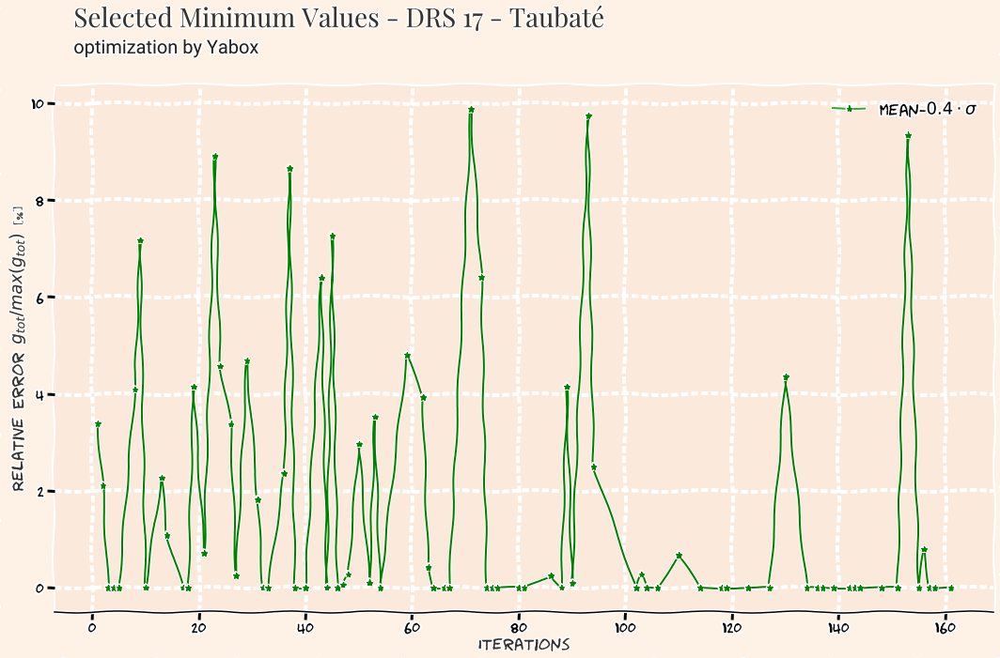

In [63]:
ggtot=[]
for districtRegion in DRS:
    versionStr=str(version)
    dateparse = lambda x: datetime.strptime(x, ' %Y-%m-%d')
    histOptAll= pd.read_table('./results/history_'+districtRegion+versionStr+'.csv', sep=",", \
                                index_col=0, header=None, parse_dates=[3], date_parser=dateparse,
        names = ["districtRegion","gtot",\
            "s0","startdate","i0","d0","startNcases","wcases","wrec"])
    histOptAll = histOptAll[['gtot', 'startdate','startNcases','s0',"i0","d0","wcases","wrec"]]
        
    #clean data
    histOptAll=histOptAll.dropna(how='all')
    histOptAll.gtot=pd.to_numeric(histOptAll.gtot, errors='coerce')
    histOptAll = histOptAll.reset_index(drop=True)
    histOptAll = histOptAll[histOptAll.loc[:,"gtot"]<0.5e14]
    
    #format integers and decimal places
    histOptAll['d0'] = histOptAll['d0'].apply(lambda x: int(x+0.5))
    histOptAll['startNcases'] = histOptAll['startNcases'].apply(lambda x: int(x+0.5))
    histOptAll['s0'] = histOptAll['s0'].apply(lambda x: int(x+0.5))
    histOptAll['i0'] = histOptAll['i0'].apply(lambda x: int(x+0.5))
    histOptAll['wcases'] = histOptAll['wcases'].apply(lambda x: round(x,4))
    histOptAll['wrec'] = histOptAll['wrec'].apply(lambda x: round(x,4))
    
    #print optimum parameters
    histOpt=histOptAll[histOptAll.gtot==min(histOptAll.gtot)]
    histOpt=histOpt.head(1)
    display(Markdown("# Results for "+districtRegion+" District Region"))
    display(histOpt.iloc[:,0:8])
    histOpt.to_csv("data/vars_optimized_"+districtRegion+model+"HistMin.csv", sep=",", index=False)
        
    #current parameters
    query = dfparam.query('DRS == "{}"'.format(districtRegion)).reset_index()
    parameters = np.array(query.iloc[:, 2:])[0]
    if len(parameters)>12:
        date,predict_range,s0,e0,a0,i0,r0,d0,startNCases,ratio,wcases,wrec,popEst = parameters
    else:
        date,predict_range,s0,e0,a0,i0,r0,d0,startNCases,ratio,wcases,wrec = parameters
    
    #query parameters
    j = query['index'].values[0]
    
    #define s0, i0 and d0
    dfparam.at[j, "s0"] = histOpt.s0
    dfparam['s0'] = dfparam['s0'].apply(lambda x: int(x+0.5))
    dfparam.at[j, "i0"] = histOpt.i0
    dfparam['i0'] = dfparam['i0'].apply(lambda x: int(x+0.5))
    dfparam.at[j, "d0"] = histOpt.d0
    dfparam.at[j, "START"] = histOpt.startNcases

    dfparam['a0'] = dfparam['a0'].apply(lambda x: int(x+0.5))
    dfparam['e0'] = dfparam['e0'].apply(lambda x: int(x+0.5))
    dfparam['r0'] = dfparam['r0'].apply(lambda x: int(x+0.5))
    dfparam['d0'] = dfparam['d0'].apply(lambda x: int(x+0.5))
    #define Start N Cases
    dfparam['START'] = dfparam['START'].apply(lambda x: int(x+0.5))
    #define date, wcases, wrec
    dfparam.at[j, "start-date"] = histOpt.startdate.dt.strftime('%Y-%m-%d').values[0]
    dfparam.at[j, "WCASES"] = histOpt.wcases
    dfparam.at[j, "WREC"] = histOpt.wrec
    
    #save new parameters
    dfparam.to_csv("data/param_optimized_"+model+"_HistMin.csv", sep=",", index=False)
    
    ggtot.append(histOpt.gtot.values[0])
    
    #prepare plotting
    color_bg = '#FEF1E5'
    # lighter_highlight = '#FAE6E1'
    darker_highlight = '#FBEADC'
    plt.rc('font', size=14)
    
    with plt.xkcd():
        fig, ax = plt.subplots(figsize=(15, 10),facecolor=color_bg)
        ax.patch.set_facecolor(darker_highlight)
        
        #fonts for the thicks
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontproperties(comic_font)
            label.set_fontsize(16) # Size here overrides font_prop
        
        #labels for x and y axis
        plt.xlabel("Iterations", fontproperties=comic_font)
        plt.ylabel("Error in Objective Function", fontproperties=comic_font, alpha = .75)
        
        # Hide the left, right and top spines
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)

        #PLOTTING itself
        x=histOptAll.index
        y=histOptAll.gtot
        ax.plot(x,y, label="gtot")
        display(Markdown("## 5 Lowest Results"))
        histMin=histOptAll.nsmallest(5, ['gtot']).sort_values('gtot').iloc[:,0:8]
        display(histMin)

        ax.scatter(histMin.index, histMin.gtot,label="5 lowest",c='green',marker='*',s=400)
        histOptAll.rolling(100).mean()['gtot'].plot(label="100th average")

        # Adding a title and a subtitle
        plt.text(x = 0.02, y = 1.11, s = "Initial Conditions Optimization - "+districtRegion,
                    fontsize = 34, weight = 'bold', alpha = .75,transform=ax.transAxes, 
                    fontproperties=heading_font)
        plt.text(x = 0.02, y = 1.06,
                    s = "optimization by "+model,
                    fontsize = 26, alpha = .85,transform=ax.transAxes, 
                    fontproperties=subtitle_font)
        
        leg=ax.legend(frameon=False,prop=comic_font,fontsize=20)
        for lh in leg.legendHandles: 
            lh.set_alpha(0.75)
        ax.grid(True, linestyle='--', linewidth='2', color='white',alpha=0.1)

        fig.tight_layout()
        strFile ='./results/convergence_'+districtRegion+versionStr+'.png'
        fig.savefig(strFile, facecolor=fig.get_facecolor(), edgecolor=fig.get_edgecolor())
        plt.show()
        
        fig, ax = plt.subplots(figsize=(15, 10),facecolor=color_bg)
        ax.patch.set_facecolor(darker_highlight)
        
        # Hide the left, right and top spines
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        
        #fonts for the thicks
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontproperties(comic_font)
            label.set_fontsize(16) # Size here overrides font_prop
        
        histMin=histOptAll.iloc[:,0:8]
        histMin.sort_index(inplace=True)
        
        histMin['error']=histMin.gtot/histMin.gtot.max()*100
        x=histMin.index[histMin.error<histMin.error.mean()-0.4*histMin.error.std()]
        y=histMin.error[histMin.error<histMin.error.mean()-0.4*histMin.error.std()]
                
        ax.plot(x, y, label="mean-$0.4 \cdot \sigma$",c='green',marker='*')
        
        #labels for x and y axis
        plt.xlabel("Iterations", fontproperties=comic_font, alpha = .75)
        plt.ylabel("Relative Error $g_{tot}/max(g_{tot})$ [%]", fontproperties=comic_font, alpha = .75)

        # Adding a title and a subtitle
        plt.text(x = 0.02, y = 1.11, s = "Selected Minimum Values - "+districtRegion,
                    fontsize = 34, weight = 'bold', alpha = .75,transform=ax.transAxes, 
                    fontproperties=heading_font)
        plt.text(x = 0.02, y = 1.06,
                    s = "optimization by "+model,
                    fontsize = 26, alpha = .85,transform=ax.transAxes, 
                    fontproperties=subtitle_font)
        
        leg=ax.legend(frameon=False,prop=comic_font,fontsize=20)
        for lh in leg.legendHandles: 
            lh.set_alpha(0.75)
        ax.grid(True, linestyle='--', linewidth='2', color='white',alpha=0.1)

        fig.tight_layout()
        strFile ='./results/minimumPoints_'+districtRegion+versionStr+'.png'
        fig.savefig(strFile, facecolor=fig.get_facecolor(), edgecolor=fig.get_edgecolor())
        plt.show()

In [64]:
display(Markdown("# Final Results for Initial Conditions"))
display(Markdown("## "+model+" optimization model"))

from IPython.display import display
from IPython.display import clear_output
from IPython.display import HTML

dfparam["gtot"] = pd.Series(ggtot)
dfparam['gtot'] = dfparam['gtot'].apply(lambda x: int(x+0.5))

gtot_min=dfparam.gtot.min()
gtot_max=dfparam.gtot.max()
gtot_range=gtot_max-gtot_min
gtot_mean=dfparam.gtot.mean()
gtot_std=dfparam.gtot.std()

gtot_high=(gtot_mean)/gtot_range
gtot_low=abs(gtot_mean-gtot_std)/gtot_range

s = dfparam.style.background_gradient(cmap='RdYlGn_r', axis=0,subset=['gtot'],low=gtot_low/2.74,high=gtot_high/100)
display(s)

# Final Results for Initial Conditions

## Yabox optimization model

,DRS,start-date,prediction-range,s0,e0,a0,i0,r0,d0,START,RATIO,WCASES,WREC,gtot
0,DRS 01 - Grande São Paulo,2020-03-18,200,3429577,0,0,2715,300,263,219,0.150000,0.728400,0.025000,246304248
1,DRS 02 - Araçatuba,2020-04-02,200,609088,0,0,1644,0,90,237,0.150000,0.681800,0.051100,237585
2,DRS 03 - Araraquara,2020-04-01,200,125940,0,0,556,0,10,135,0.150000,0.413200,0.066100,125686
3,DRS 04 - Baixada Santista,2020-04-02,200,543935,0,0,2038,0,895,78,0.150000,0.767700,0.069100,981478
4,DRS 05 - Barretos,2020-04-02,200,330072,0,0,446,0,32,246,0.150000,0.448800,0.038200,93285
5,DRS 06 - Bauru,2020-03-31,200,857122,0,0,543,0,228,241,0.150000,0.647100,0.028700,539994
6,DRS 07 - Campinas,2020-04-01,200,811781,0,0,1043,0,422,204,0.150000,0.459300,0.044400,3766531
7,DRS 08 - Franca,2020-04-01,200,528415,0,0,672,0,24,110,0.150000,0.724000,0.024100,99780
8,DRS 09 - Marília,2020-04-01,200,430205,0,0,1045,0,190,196,0.150000,0.699700,0.057800,163234
9,DRS 10 - Piracicaba,2020-03-31,200,342430,0,0,2113,0,214,133,0.150000,0.794400,0.052800,614504
